## Detectron2 Tests

In [56]:
import os
os.sys.path
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

torch:  1.11 ; cuda:  1.11.0


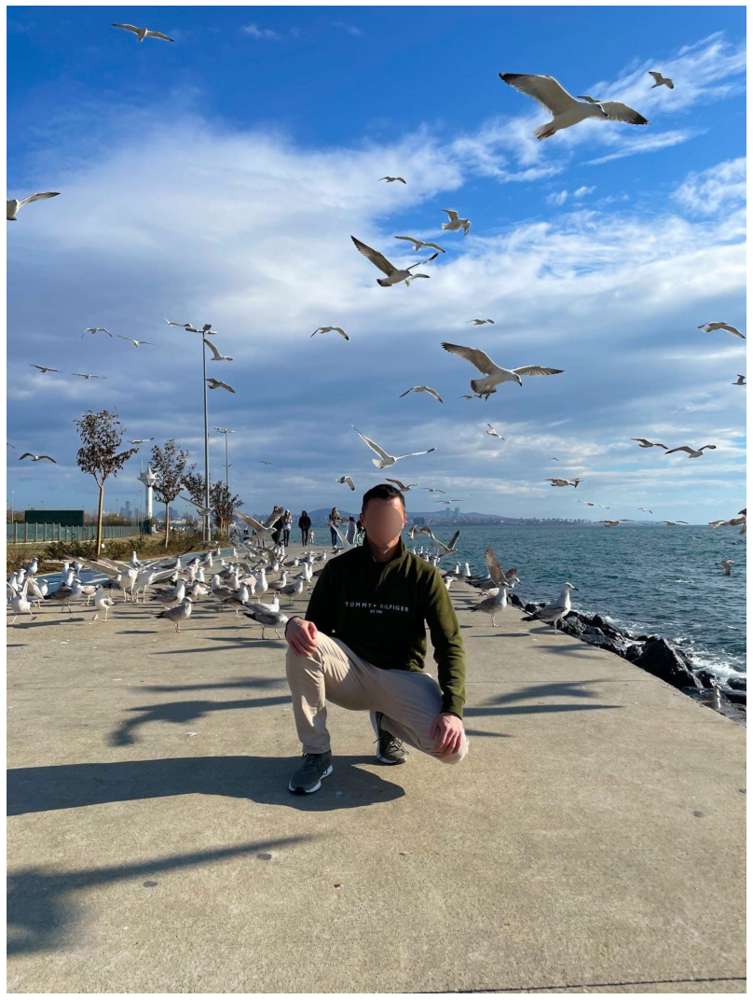

In [2]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
im = cv2.imread("images/person_and_gulls.jpg")
plt.axis('off')
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))

## Object Detection

In [4]:
# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

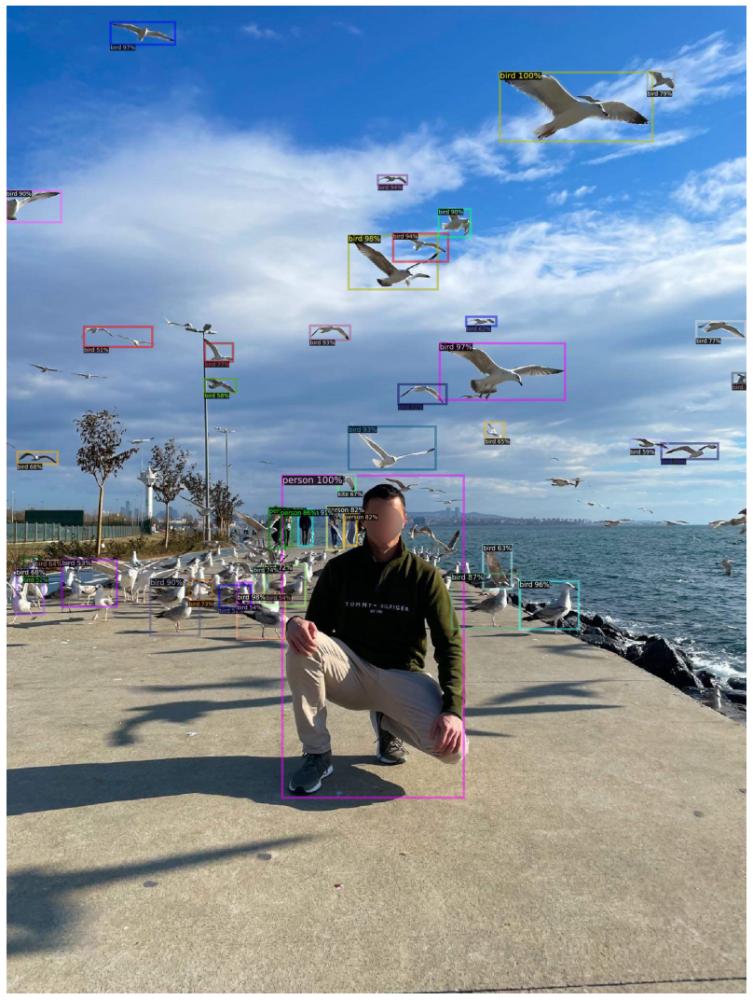

In [6]:
# Draw the predictions on the image by using `Visualizer`
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#plt.figure(figsize = (14, 10))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## Instance Segmentation

In [7]:
# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

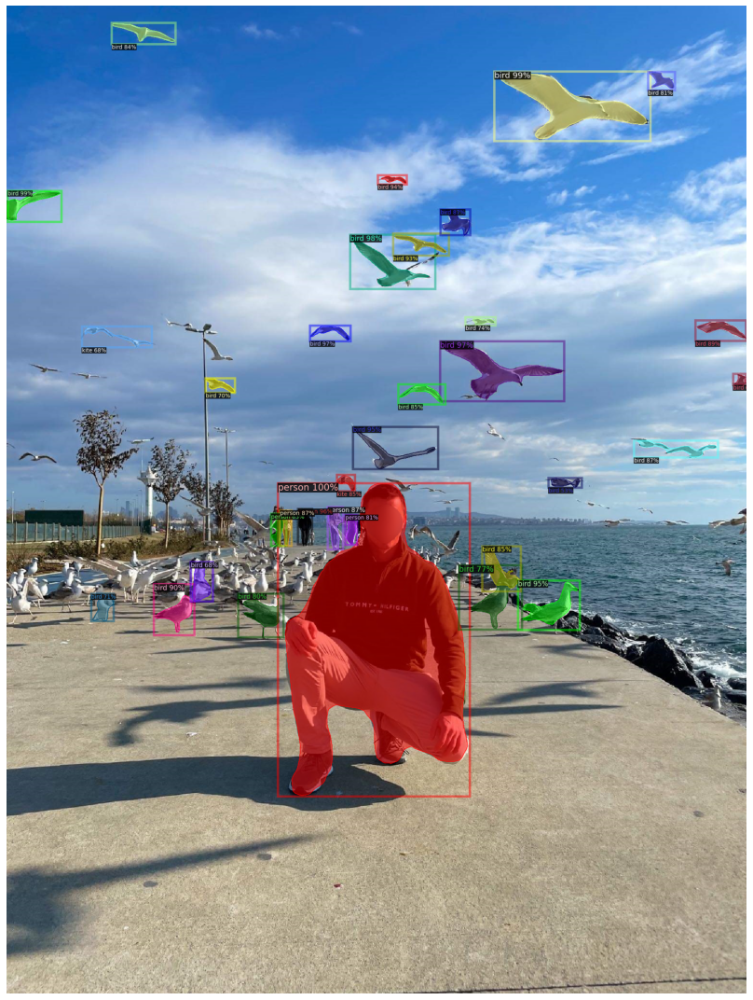

In [8]:
# Draw the predictions on the image by using `Visualizer`
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## Panoptic Segmentation
### Combination of Instance and Semantic segmentation where each pixel has 2 class:
### - object class
### - values group class

In [9]:
# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]

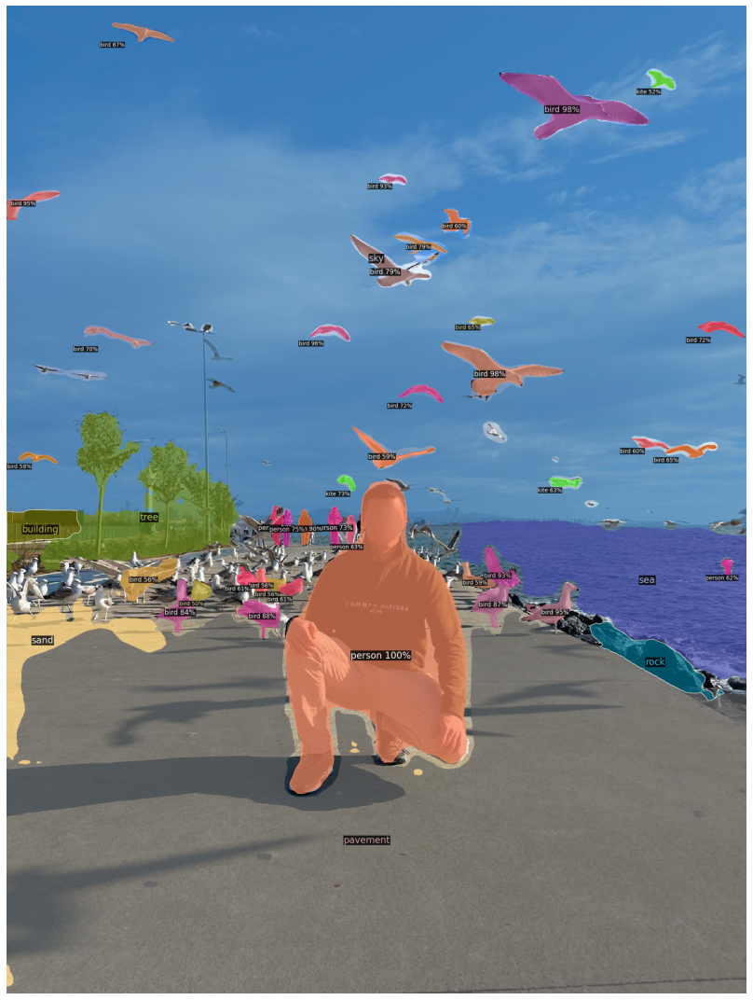

In [10]:
# Draw the predictions on the image by using `Visualizer`
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## Keypoint Detection

In [12]:
# Create config
cfg = get_cfg()  
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

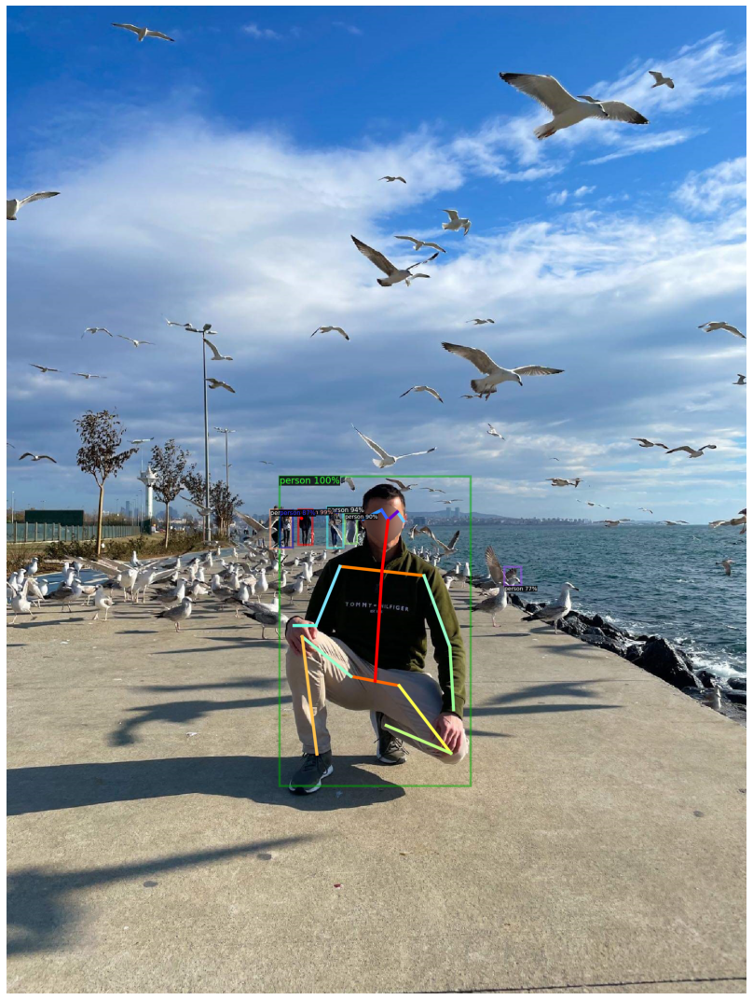

In [13]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## Cityscapes

In [14]:
# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Cityscapes/mask_rcnn_R_50_FPN.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Cityscapes/mask_rcnn_R_50_FPN.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im)

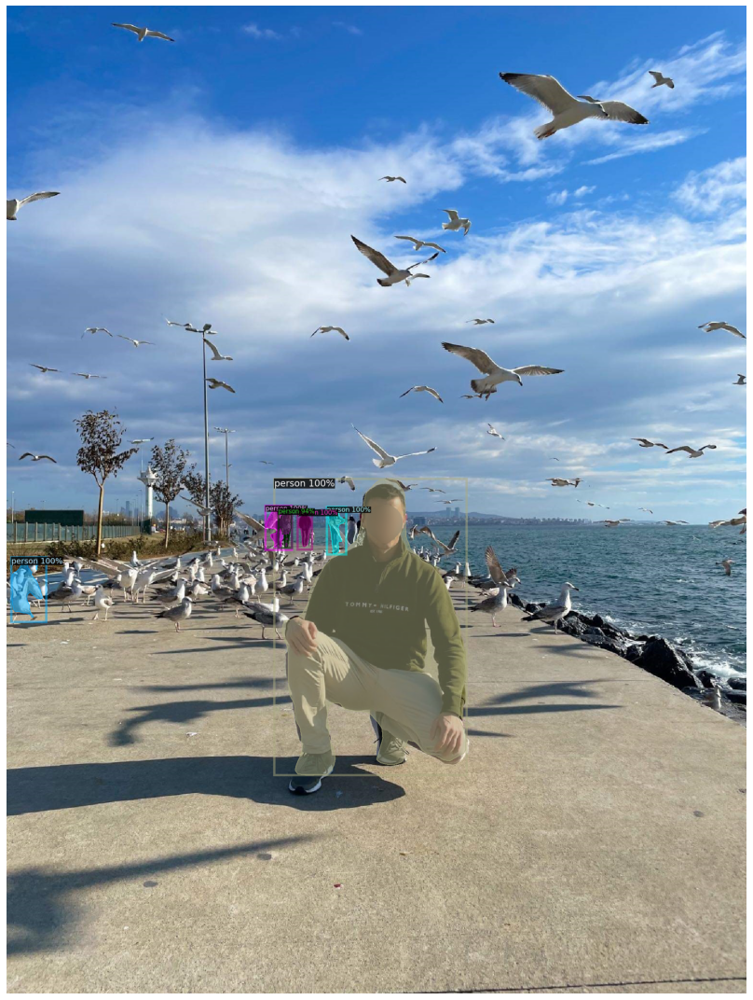

In [15]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

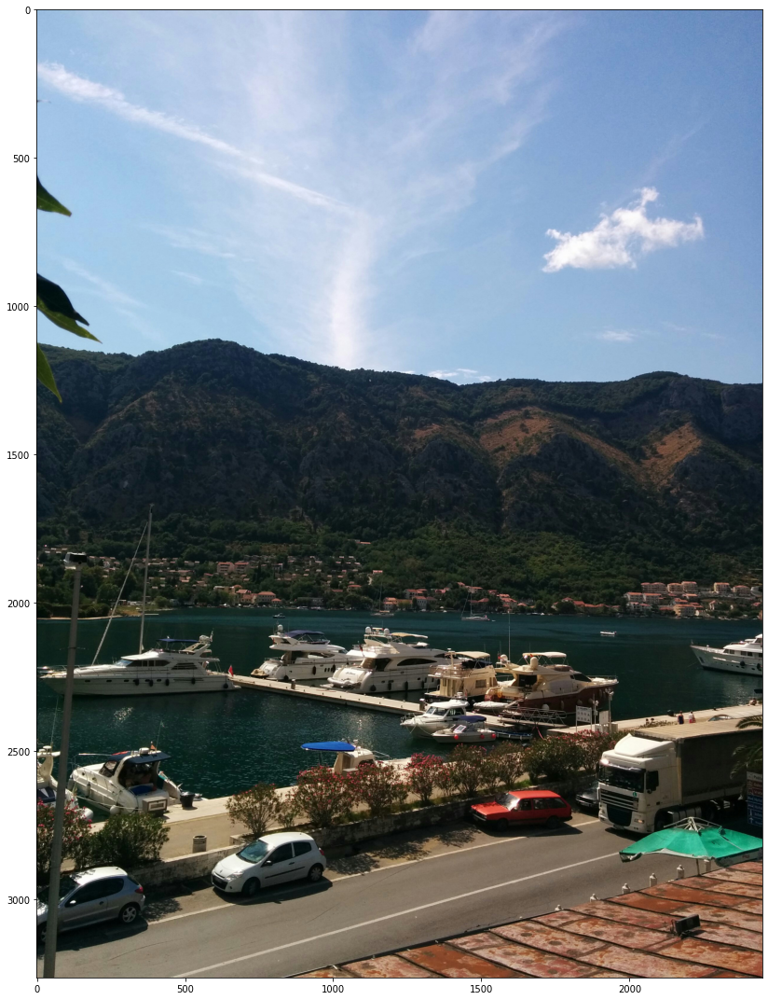

In [16]:
im2 = cv2.imread("images/cars_boats.jpg")
plt.imshow(cv2.cvtColor(im2, cv2.COLOR_BGR2RGB))

In [17]:
# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Cityscapes/mask_rcnn_R_50_FPN.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Cityscapes/mask_rcnn_R_50_FPN.yaml")

# Create predictor
predictor = DefaultPredictor(cfg)

# Make prediction
outputs = predictor(im2)

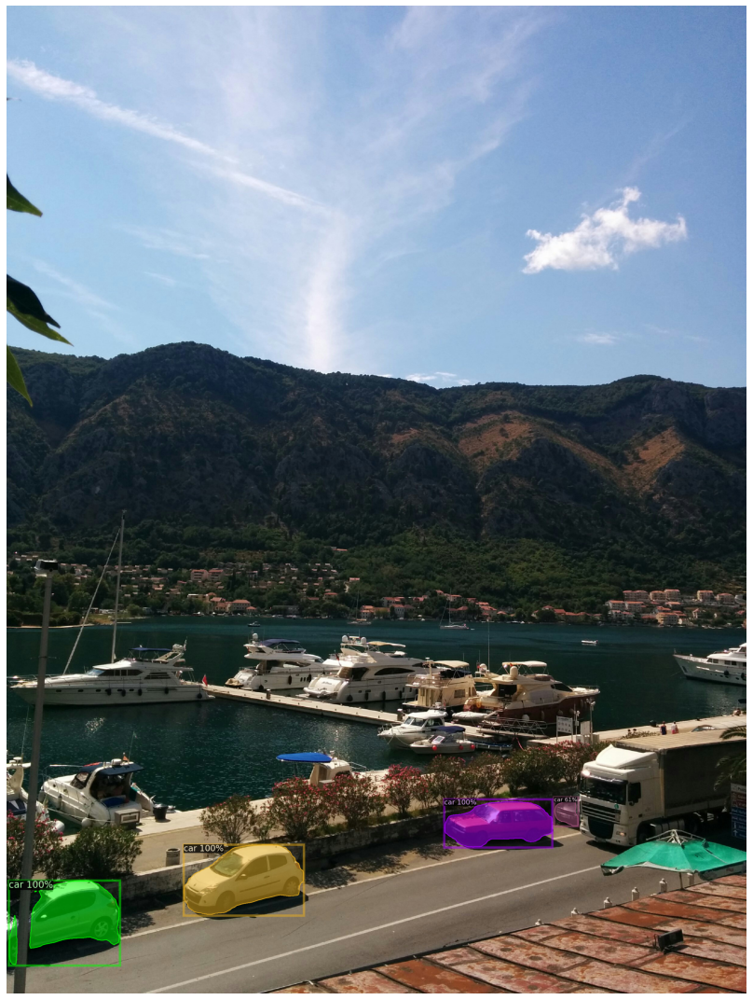

In [18]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im2[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

## DensePose

In [42]:
%cd ~/detectron2/projects/DensePose
%pwd

/home/silver/detectron2/projects/DensePose


'/home/silver/detectron2/projects/DensePose'

In [53]:
!python apply_net.py show configs/densepose_rcnn_R_50_FPN_s1x.yaml configs/model_final_162be9.pkl person_and_gulls.jpg dp_contour,bbox --output gulls_densepose_contour.jpg

/home/silver/anaconda3/envs/detectron2/lib/python3.8/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646755903507/work/aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/silver/detectron2/projects/DensePose/densepose/vis/densepose_results.py:133: UserWarning: The following kwargs were not used by contour: 'cfg', 'texture_atlas', 'texture_atlases_dict'
  plt.contour(u, self.levels, extent=extent, **self.plot_args)
/home/silver/detectron2/projects/DensePose/densepose/vis/densepose_results.py:134: UserWarning: The following kwargs were not used by contour: 'cfg', 'texture_atlas', 'texture_atlases_dict'
  plt.contour(v, self.levels, extent=extent, **self.plot_args)
/home/silver/detectron2/projects/DensePose/densepose/vis/densepose_results.py:133: UserWarning: No contour le

In [54]:
im = cv2.imread("gulls_densepose_contour.0001.jpg")

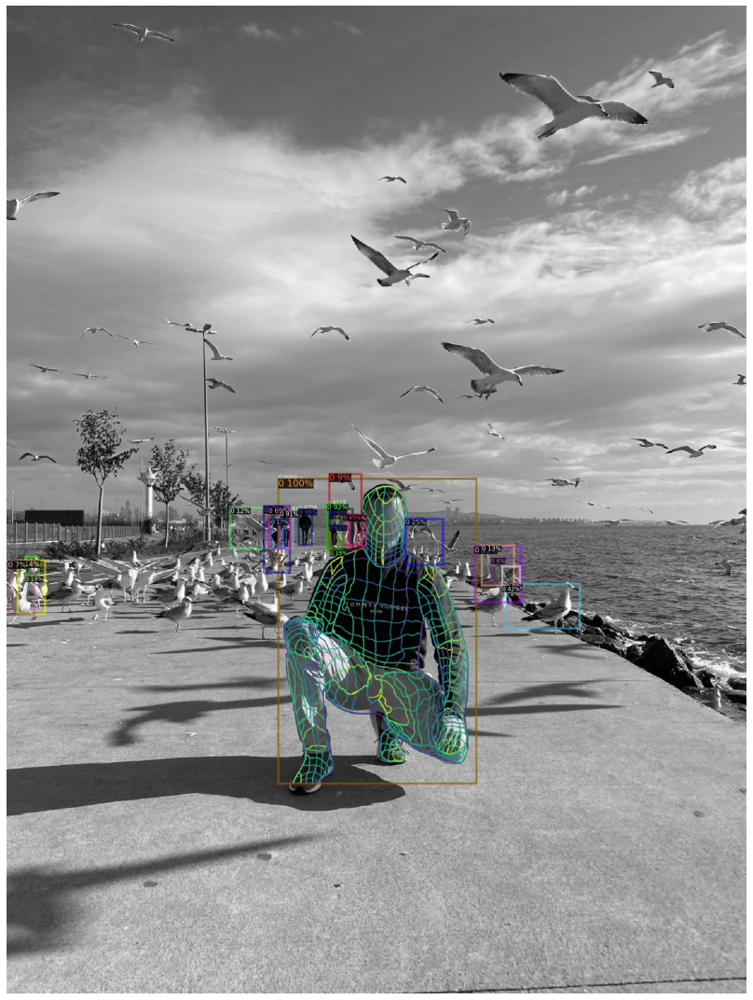

In [55]:
plt.rcParams["figure.figsize"] = [20, 15]
plt.rcParams["figure.autolayout"] = True
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.axis('off')
plt.imshow(cv2.cvtColor(output.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))